# IV. Time series: visualization

---
**Author(s):** Quentin Yeche, Kenji Ose, Dino Ienco - [UMR TETIS](https://umr-tetis.fr) / [INRAE](https://www.inrae.fr/)

---

## 1. Introduction

In this notebook we will introduce some tips for visualizing and masking time series.

In [section 3](#3-retrieving-a-sentinel-2-time-series) we will retrieve a time series and introduce the Scene Classification Layer

[Section 4](#4-example-of-ploting-time-series-images) deals with plotting time series in various ways.

[Section 5](#5-gap-filling) covers gap filling and interpolation methods

In [section 6](#6-conversion-of-s2-time-series-into-median-time-series) we will revisit resampling to create median time series

[Section 7](#7-variations-and-change-in-time-series) is a primer to some convenient operators to calculate variations over time (or any other dimension)

Finally [Section 8](#8-extra-making-a-nice-looking-animation) is an optional extra in which we create an animated GIF from a time series.

## 2. Library imports

As usual, we import all the required Python libraries.

In [ ]:
# this cell is only useful if you're using an environment like Google Collab or
# Microsoft Planetary Computer's servers
def test_import_or_install(imports):
  import importlib
  restart_needed = False
  for import_name, pip_name in imports:
    try:
      importlib.import_module(import_name, package=None)
    except ModuleNotFoundError:
      if not restart_needed:
          restart_needed= True
          print('\033[91m' + ("ONE OR MORE LIBRARIES HAVE TO BE INSTALLED, "
          "PLEASE RESTART THE NOTEBOOK AFTER THIS CELL FINISHES EXECUTING "
          "TO ENSURE PROPER FUNCTIONALITY") + "\x1b[0m")
      !pip install {pip_name}
  if restart_needed:
    raise ImportError('\033[91m' + ("LIBRARIES HAVE BEEN INSTALLED. "
          "PLEASE RESTART THE NOTEBOOK NOW ") + "\x1b[0m")

imports = [('pystac_client', 'pystac-client'),
           ('planetary_computer', 'planetary-computer'),
           ('stackstac', 'stackstac'),
           ('geogif', 'geogif')
           ]

test_import_or_install(imports)

In [ ]:
# STAC access
import pystac_client
import planetary_computer

# dataframes
import pandas as pd

# xarrays
import xarray as xr

# library for turning STAC objects into xarrays
import stackstac

# visualization
from matplotlib import pyplot as plt

# library for generating animated gif
import geogif

# miscellanous
import numpy as np
from IPython.display import display
import time

## 3. Retrieving a Sentinel-2 time series

Here we run the code of the [previous notebook](04-Time-series-part-1.ipynb) in order to get a Sentinel-2 image time series, in the region of Montpellier. We will however limit ourselves to only one year: 2020.


From the previous notebook we know that we're only interested in orbit 8. We also don't want to retrieve images if they are too cloudy. We already know that this information is provided with the properties `sat:relative_orb` and `eo:cloud_cover`. One powerful feature of STAC is that We can specify these things directly inside our search with the `query` argument. Here's the value we will use for `query`:


```
{
 "sat:relative_orbit": {"eq": 8},
  "eo:cloud_cover": {"lt": 20}
}`
```

 The operators that Planetary Computer accepts are the following:
 - `eq` : equal to
 - `neq` : not equal to
 - `lt` : less than
 - `lte` : less than or equal to
 - `gt` : greater than
 - `gte` : greater than or equal to
 - `in` : used with an iterable value: `"property" : {"in": iterable}` evaluates to true if the value of `property` is an element of `iterable` (this is similar to the `property in iterable` boolean expression)

 > **Note**: If multiple conditions are specified for a property, they are treated as a logical AND.


In [ ]:
aoi_bounds = [3.944092,43.526638,
              4.014816,43.568420]

# retrieving the relevant STAC Items
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
    )

time_range = f"2020-01-01/2021-01-01"
search = catalog.search(
    collections=['sentinel-2-l2a'],
    datetime=time_range,
    bbox=aoi_bounds,
    query={"sat:relative_orbit": {"eq": 8}, 
           "eo:cloud_cover": {"lt": 20}},
    sortby="datetime"
)
items = search.item_collection()
print(f"{len(items)} items found")

time_steps_pc = len(items)

bands = ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B11', 'B12', 'SCL']
array_SCL = stackstac.stack(
                    items,
                    assets = bands,
                    resolution=10,
                    bounds_latlon=aoi_bounds,
                    chunksize= (time_steps_pc, 1, 'auto', 'auto')
                    )
array_SCL.drop_duplicates('time')
array_SCL 

28 items found


<xarray.DataArray 'stackstac-43df12600419caf598641483bde513d6' (time: 28,
                                                                band: 10,
                                                                y: 472, x: 578)> Size: 611MB
dask.array<fetch_raster_window, shape=(28, 10, 472, 578), dtype=float64, chunksize=(28, 1, 472, 578), chunktype=numpy.ndarray>
Coordinates: (12/44)
  * time                                     (time) datetime64[ns] 224B 2020-...
    id                                       (time) <U54 6kB 'S2A_MSIL2A_2020...
  * band                                     (band) <U3 120B 'B02' ... 'SCL'
  * x                                        (x) float64 5kB 5.762e+05 ... 5....
  * y                                        (y) float64 4kB 4.824e+06 ... 4....
    s2:degraded_msi_data_percentage          float64 8B 0.0
    ...                                       ...
    proj:bbox                                object 8B {4900020.0, 4790220.0,...
    title                                    (band) <U36 1kB 'Band 2 - Blue -...
    common_name                              (band) object 80B 'blue' ... None
    center_wavelength                        (band) object 80B 0.49 ... None
    full_width_half_max                      (band) object 80B 0.098 ... None
    epsg                                     int64 8B 32631
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(576230, 4819730, 582010, 4824...
    crs:         epsg:32631
    transform:   | 10.00, 0.00, 576230.00|\n| 0.00,-10.00, 4824450.00|\n| 0.0...
    resolution:  10

### 3.1. The Scene Classification Layer

#### 3.1.1. What is the SCL ?

In addition to getting the 9 bands, we also retrieved the Scene Classification Layer (SCL). Note that we're using `uint8` for the data type, because as we'll see shortly, the SCL only uses small integer values.

 The Scene Classification Layer is a classification map for pixels. This map is produced as part of the Scene Classification algorithm and is provided by the Copernicus mission directly. There are 12 different classes as can be seen below:
| Label |      Classification      |
|:-----:|:------------------------:|
|   0   |          NO_DATA         |
|   1   |  SATURATED_OR_DEFECTIVE  |
|   2   |       CAST_SHADOWS (dark area pixels)    |
|   3   |       CLOUD_SHADOWS      |
|   4   |        VEGETATION        |
|   5   |       NOT_VEGETATED (bare soil)     |
|   6   |           WATER          |
|   7   |       UNCLASSIFIED       |
|   8   | CLOUD_MEDIUM_PROBABILITY |
|   9   |  CLOUD_HIGH_PROBABILITY  |
|   10  |        THIN_CIRRUS       |
|   11  |        SNOW or ICE       |

**Note:** The classification of pixels with a size of 10 m can never be completely accurate. As a consequence the SCL can sometimes show misclassified pixels. However the overall quality of the SCL still makes it a useful tool for many purposes.

3.1.2. Assigning the SCL as a coordinate

We retrieved the SCL along with the spectral bands. However this poses an issue of consistency: the spectral bands contain reflectance values while the SCL contains integers representing classes. While this issue is manageable it is always better to use homogenous data.

One thing we can do is to instead move the SCL to a coordinate in our DataArray. We've seen before that coordinates can be attached to a dimension, but they can actually be attached to more than one dimension! Here we will attach the SCL to the `time`, `x` and `y` dimensions:

> **Note**: One small disadvantage of assigning the SCL as a new coordinate is that the SCL has to be downloaded entirely. However this is usually acceptable since the SCL only contains small integers.

In [ ]:
# the SCL contains single-digit integers which can be stored in an uint8
SCL = array_SCL.sel(band='SCL').squeeze().astype('uint8')
array = array_SCL.sel(band=~(array_SCL.band == 'SCL'))
array = array.assign_coords(SCL=(('time', 'y', 'x'), SCL.values))
array

<xarray.DataArray 'stackstac-43df12600419caf598641483bde513d6' (time: 28,
                                                                band: 9,
                                                                y: 472, x: 578)> Size: 550MB
dask.array<getitem, shape=(28, 9, 472, 578), dtype=float64, chunksize=(28, 1, 472, 578), chunktype=numpy.ndarray>
Coordinates: (12/45)
  * time                                     (time) datetime64[ns] 224B 2020-...
    id                                       (time) <U54 6kB 'S2A_MSIL2A_2020...
  * band                                     (band) <U3 108B 'B02' ... 'B12'
  * x                                        (x) float64 5kB 5.762e+05 ... 5....
  * y                                        (y) float64 4kB 4.824e+06 ... 4....
    s2:degraded_msi_data_percentage          float64 8B 0.0
    ...                                       ...
    title                                    (band) <U36 1kB 'Band 2 - Blue -...
    common_name                              (band) object 72B 'blue' ... 'sw...
    center_wavelength                        (band) object 72B 0.49 ... 2.19
    full_width_half_max                      (band) object 72B 0.098 ... 0.242
    epsg                                     int64 8B 32631
    SCL                                      (time, y, x) uint8 8MB 5 5 ... 6 6
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(576230, 4819730, 582010, 4824...
    crs:         epsg:32631
    transform:   | 10.00, 0.00, 576230.00|\n| 0.00,-10.00, 4824450.00|\n| 0.0...
    resolution:  10

When looking at the coordinates of `array` we can see the new coordinate SCL, which is correctly attached to the three dimensions

## 4. Example of ploting time series images


### 4.1. Plotting by default

We will now load several spectral bands and projet them through the RGB color space in order to produce colored images, or color composites. It is based on the principale of additive color:

<figure align="center">
  <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/e/e0/Synthese%2B.svg/1024px-Synthese%2B.svg.png" width="30%" alt="additive color">
  <figcaption>STAC Collection Specification </br> Figure by <a href="https://commons.wikimedia.org/w/index.php?curid=818982">Wikipedia</a> (license <a href="https://creativecommons.org/licenses/by/3.0">CC BY-SA 3.0</a>)
  </figcaption>
</figure>



In the world of remote sensing, there are two well-known color composites:

- the **natural colors composite**, or true colors, consists in assigning respectively to the red, green and blue filters the red, green and blue spectral bands. On display, the color reproduction is very close to what a human could perceive from space. Vegetation appears in shades of green, water in blue, urban areas in light gray.
- the **false-color composite** images display spectral bands which are different from primary colors. In fact, the color of the objects does not correspond to their “real” color as our eye would perceive it. The false-color is used to highlight certain objects in the image, taking advantage of their spectral signature. Therefore, the composition in infrared false colors is commonly used to study vegetation. It is generally accepted that the infrared, red and green spectral bands are allocated, respectively, to the red, green and blue filters. Vegetation is seen in red since its reflectance is at its maximum in the infrared. The shades vary according to the chlorophyll activity of the species in the environment.


---
> **Exercise**: 
Plot the first date of the DataArray in infared false-color composite (infrared, red, green bands). 

**Tips:** 
 - Don't hesitate to look at the `title` coordinate of the data cube to find which are the correct bands
 - Remember that you can use `vmax=2500` with `imshow` to ensure a quick and dirty clipping and normalization of the image

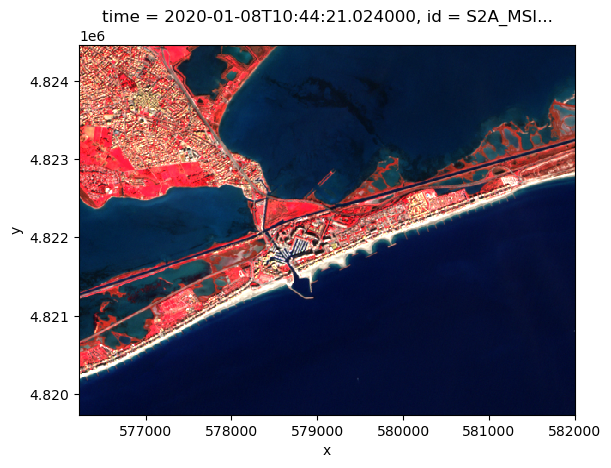

In [ ]:
# to fill
# ...
# ...

For time series specifically it can be useful to look at mosaic of different dates in order to see variations. There is a fairly straightforward way to do so with the following code:

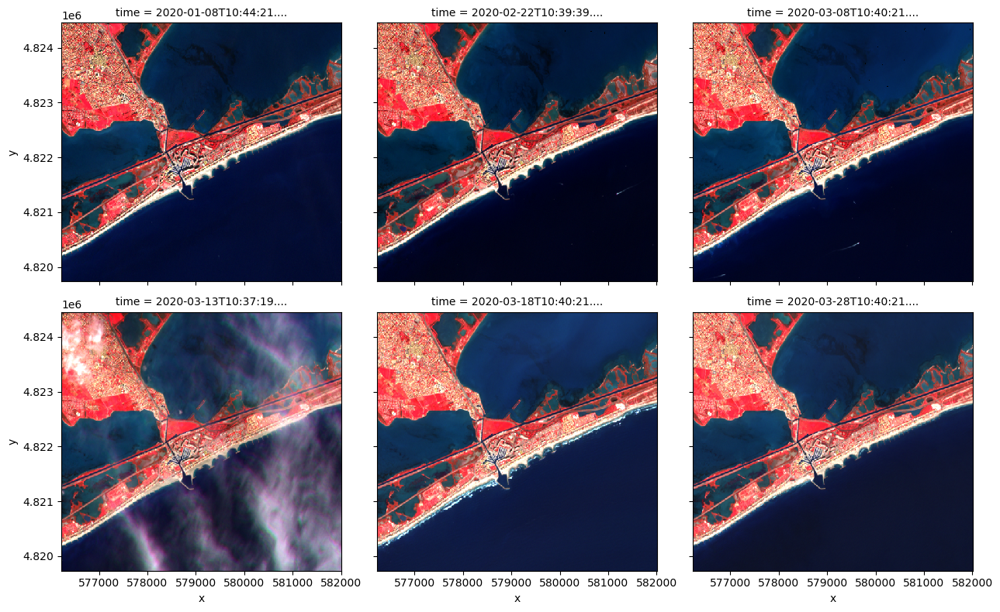

In [ ]:
source = array.sel(band=["B08", "B04", "B03"])
rgb = source.isel(time=range(6))
# we specify with col='time' that each date constitutes an image in our mosaic
rgb.plot.imshow(col_wrap=3, col="time", vmax=2500, size=4)


The NDVI (Normalized Difference Vegetation Index) is a vegetation index based on the difference between red and near infrared (nIR) values. This index exploits the spectral signature of the vegetation which is very particular, because it shows a very marked peak in the near infrared, and a lower reflectance in the red. As a consequence, this index allows to highlight the presence of vegetation.

Its formula is as follows:
$$NDVI = \frac{nIR - Red}{nIR + Red}$$

> **Exercise:**
Plot the NDVI for the first 6 dates. Use the  `cmap='RdYlGn'`  argument in `imshow` for great visual results


/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


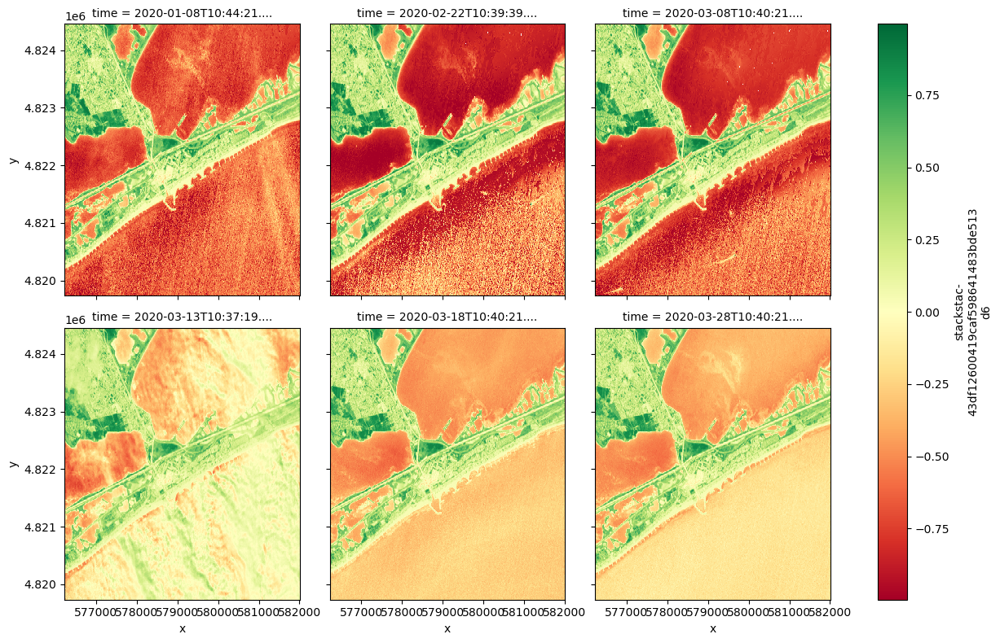

In [ ]:
# to fill
# ...
# ...

As we can see on the previous plots, some images are cloudy. It's time to mask those invalid pixels.

---

### 4.2. Cloud masking

For masking the clouds, Sentinel-2 items contains an asset, called SCL, that allows masking different types of invalid pixels.

For information, SCL band is coded as follows:

|Bit| value Class             |
|---|-------------------------|
|0  | No data                 |
|1  | Saturated or defective  |
|2  | Dark area pixels        |
|3  | Cloud shadows           |
|4  | Vegetation              |
|5  | Bare Soil               |
|6  | Water                   |
|7  | Unclassified            |
|8  | Cloud medium probability|
|9  | Cloud high probability  |
|10 | Thin cirrus             |
|11 | Snow or ice             |
   
In this situation we will consider that pixels with an SCL of 3,8, 9 or 10 are undesirable and should be replaced if possible. We can simply mask them to see them more clearly:

---
> **Exercise** Using a masking process, set the undesirable pixels to `np.nan` and then plot the first 6 masked images:

Tips: 
 - `.isin` can be useful.
 - xr.where is also recommended.
 - Remember that you can negate a boolean array with the `~` operator (instead of `not`).

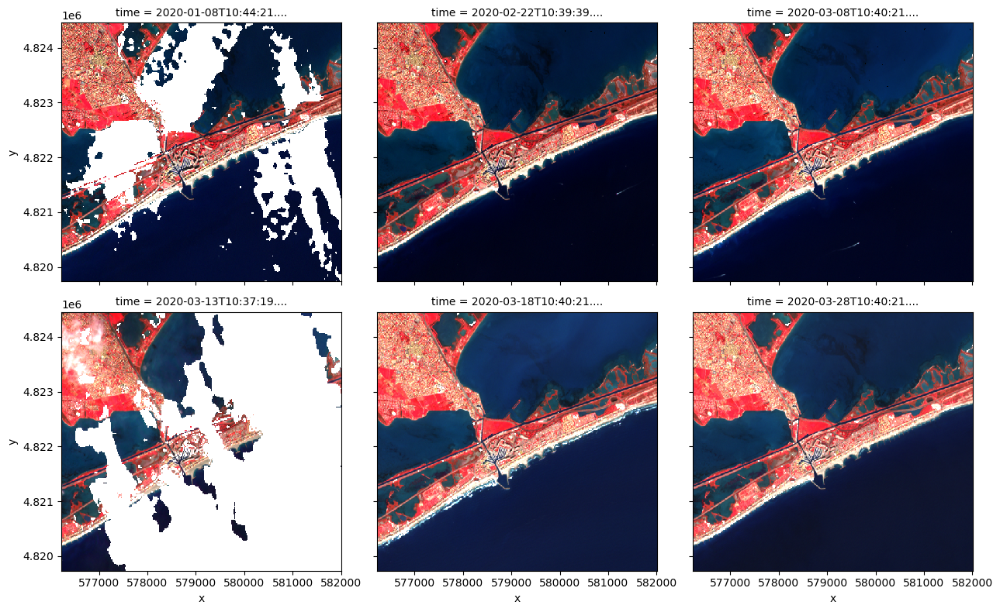

In [ ]:
# to fill
# ...
# ...

---
Rather than looking at the images visually, we can also compute the percentage of pixels which have an SCL class of 3, 8, 9 or 10:

Text(0.5, 1.0, 'Fraction of cloudy pixels')

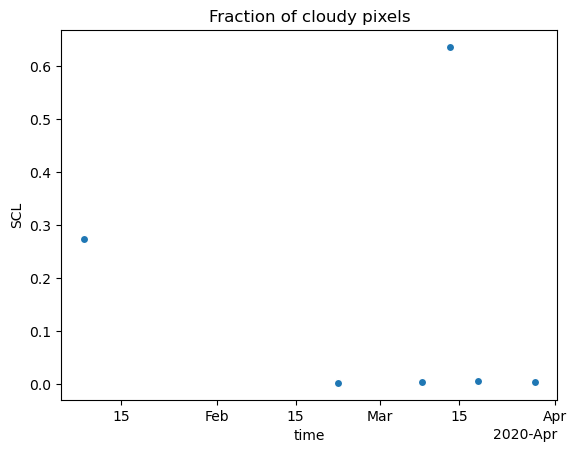

In [ ]:
cloudy_percentage = array.SCL.isin([3, 8, 9, 10]).mean(dim=['x', 'y'])
cloudy_percentage.isel(time=range(6)).plot.scatter()
plt.title('Fraction of cloudy pixels')

## 5. Gap Filling

We would like to perform a temporal **gapfilling** of our Sentinel-2 time series. We have to calculate an interpolated value for all masked pixels. Here we choose the linear method and apply it to the masked xarray. 

In [ ]:
# this was already done wit hthe previous exercise
# mask creation
SCL = array.SCL
mask = SCL.isin([3, 8, 9, 10])

# applying the mask
result = array.where(~mask) #equivalent to array.where(~mask, np.nan)

source_m = result.sel(band=["B08", "B04", "B03"])


# we previously replaced the cloudy pixels with np.nan so `interpolate_na`
# does exactly what we need
interpolated = source_m.interpolate_na(dim="time", method="linear")

# let's compute `interpolated` as it will be re-used several times in this section for producing visuals
interpolated = interpolated.compute()

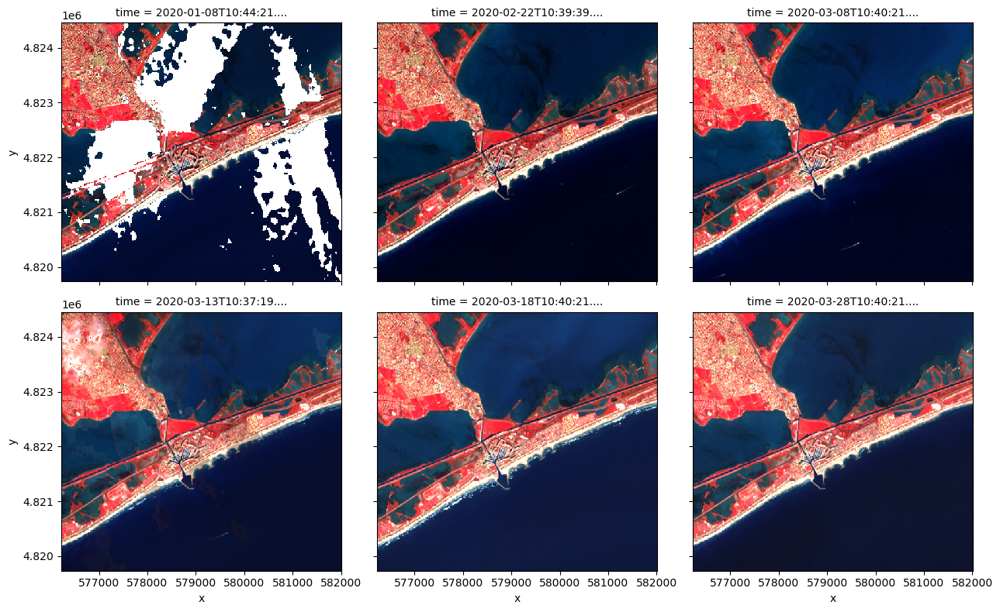

In [ ]:
interpolated.isel(time=range(6)).plot.imshow(col_wrap=3, col="time", rgb="band", vmax=2500, size=4)

It seems that our first image hasn't changed. Indeed that's one issue with interpolation : it requires having data on both sides of the missing value. This means that the very first and last dates can't be interpolated. We can look at the effects of the interpolation on the fraction of cloudy pixels for each date:

Text(0.5, 1.0, 'Effects of interpolation')

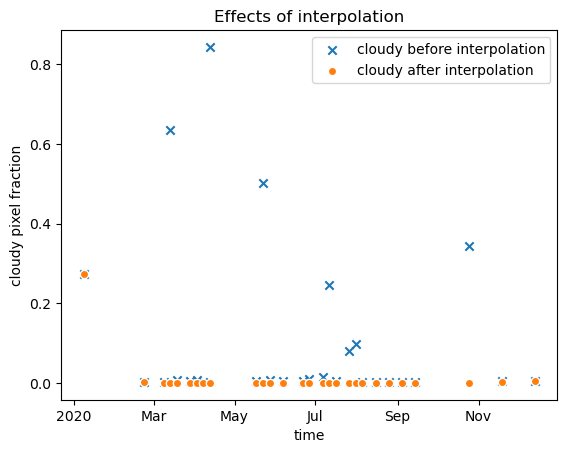

In [ ]:
cloudy_percentage.plot.scatter(marker='x')
interpolated.isnull().mean(dim=['x', 'y', 'band']).plot.scatter()
plt.legend(['cloudy before interpolation', 'cloudy after interpolation'])
plt.ylabel('cloudy pixel fraction')
plt.title('Effects of interpolation')

We indeed see that the very first date had no interpolation at all. By chance the very last date in the series had few cloudy pixels, so the lack of interpolation is not hurting much in this case. One key takeaway from this is that if possible, it is generally advised to initially construct a bigger time series than is needed, so that you can remove the problems caused by the extremities of the time series.

In the previous scatter plot we can see that the after interpolation values are  somewhat crushed by the values before interpolation. Let's isolate them for now:

> **Note:** We also skip the very first date. As we've seen, it is not interpolated, so the amount of cloudy pixels is disproportionately high and would change the scale too much.

Text(0.5, 1.0, 'Cloudy pixels after interpolation')

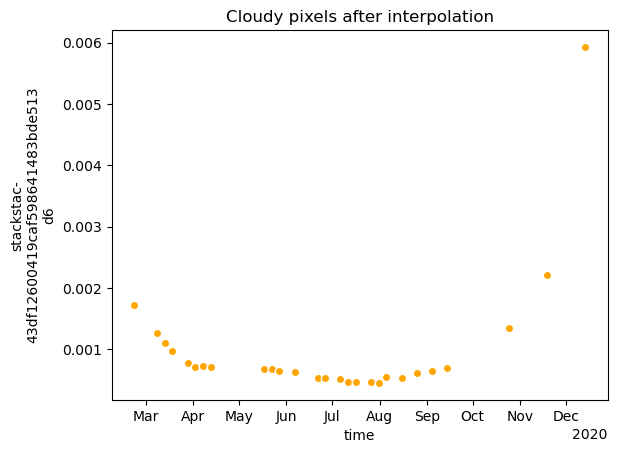

In [ ]:
# skipping the first date to have a readable scale
interpolated.isnull().isel(time=slice(1,None)).mean(dim=['x', 'y', 'band']).plot.scatter(c='orange')
plt.title('pixel fraction')
plt.title('Cloudy pixels after interpolation')

With this plot we can see another, more subtle limitation of interpolation. We already know that interpolation requires valid data on both sides of a missing value. However it is entirely possible for a pixel to be invalid for a streak of consecutive dates in the beginning or the end of the series, in which case interpolation also can't be performed on this pixel. This is exactly what we see with this plot. The amount of cloudy pixels after interpolation decreases when moving away from either end of the series, as the likelihood of a pixel being cloudy for every single consecutive date decreases.

There's one way to further reduce the number of missing pixels: using forward-filling or backward-filling. What this does is filling NaN values by propagating values forward (respectively backward). This means that a missing pixel value will be replaced by the pixel value from the first previous date (respectively next date) for which the pixel is valid.

> **Note**: As useful as it can be interpolation is in the end an alteration of the data, and a trade-off between availability and certainty. Adding backward-filling and/or forward-filling on top of this can lead to some problematic effects where neighboring pixels have incoherent values. These methods should thus be used mindfully.

Text(0, 0.5, 'pixel fraction')

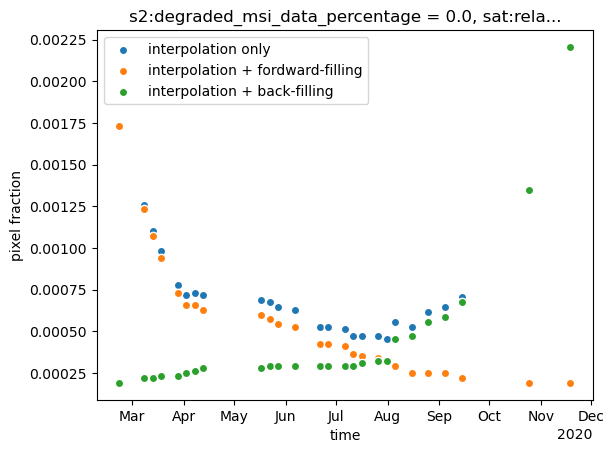

In [ ]:
interpolated_bfill = interpolated.bfill(dim= 'time')
interpolated_ffill = interpolated.ffill(dim= 'time')
# hiding first and last dates for better readability
interpolated.isnull().isel(time=slice(1,-1)).mean(dim=['x', 'y', 'band']).plot.scatter()
interpolated_ffill.isnull().isel(time=slice(1,-1)).mean(dim=['x', 'y', 'band']).plot.scatter()
interpolated_bfill.isnull().isel(time=slice(1,-1)).mean(dim=['x', 'y', 'band']).plot.scatter()
plt.legend(['interpolation only', 'interpolation + fordward-filling', 'interpolation + back-filling'])
plt.ylabel('pixel fraction')


Since we're mostly looking at the beginning of the time series, `bfill` is the better choice for us here.

In [ ]:
interpolated = interpolated_bfill

We can now finally look at the first 6 dates of the interpolated time series:

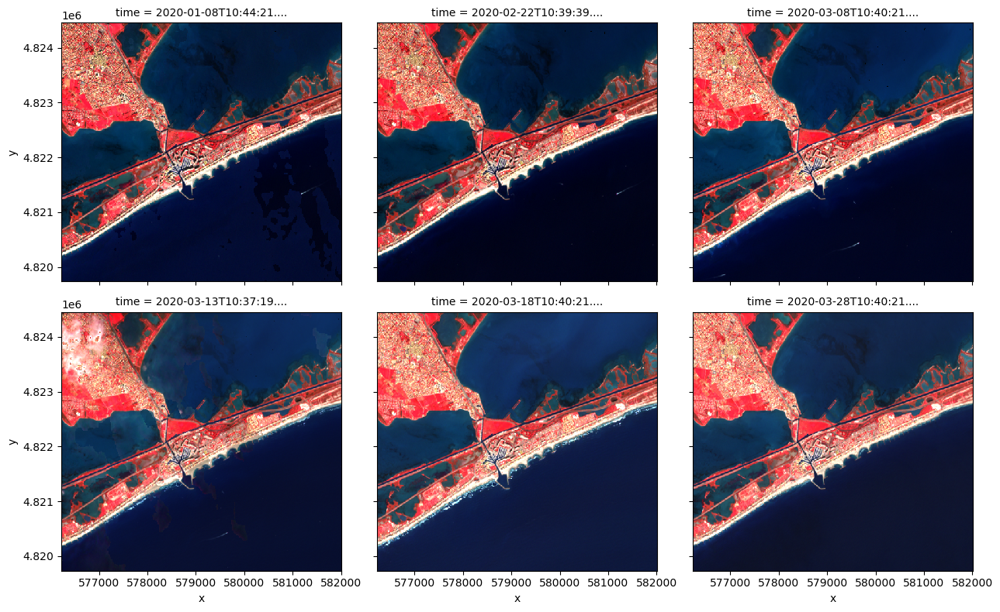

In [ ]:
rgb = interpolated.isel(time=range(6))

nir, red = interpolated.sel(band="B08").astype('float'), interpolated.sel(band="B04").astype('float')
ndvi_interpolated = (nir - red) / (nir + red)

rgb.plot.imshow(col_wrap=3, col="time", rgb="band", vmax=2500, size=4)

Now, on one pixel, we compare the NDVI time series with and without gap-filling.

/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/dask/core.py:133: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


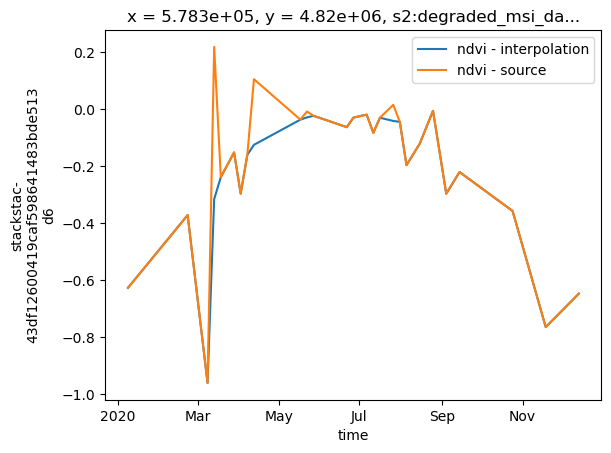

In [ ]:
# already covered in a previous exercise
nir, red = source.sel(band="B08").astype('float'), source.sel(band="B04").astype('float')
ndvi = (nir - red) / (nir + red)


x, y = 578300, 482300

ndvi_interpolated_pixel = ndvi_interpolated.sel(x=x, y=y, method='nearest')
ndvi_pixel = ndvi.sel(x=x, y=y, method='nearest')

ndvi_interpolated_pixel.plot()
ndvi_pixel.plot()
plt.legend(['ndvi - interpolation', 'ndvi - source'])
plt.show()

## 6. Conversion of S2 time series into median time series

One useful things that resampling allows is to reduce the time dimension and produce monthly composites:

In [ ]:
composites = interpolated.resample(time="MS").median("time")
composites

<xarray.DataArray 'stackstac-43df12600419caf598641483bde513d6' (time: 12,
                                                                band: 3,
                                                                y: 472, x: 578)> Size: 79MB
array([[[[1.30000000e+03, 2.08600000e+03, 2.37800000e+03, ...,
          4.00000000e+01, 4.10000000e+01, 4.10000000e+01],
         [1.36200000e+03, 2.57400000e+03, 2.06600000e+03, ...,
          4.10000000e+01, 4.00000000e+01, 4.00000000e+01],
         [1.90600000e+03, 2.43400000e+03, 1.74200000e+03, ...,
          4.50000000e+01, 3.70000000e+01, 4.00000000e+01],
         ...,
         [3.70000000e+01, 3.60000000e+01, 3.40000000e+01, ...,
          1.40000000e+01, 1.00000000e+01, 1.20000000e+01],
         [4.00000000e+01, 2.70000000e+01, 3.10000000e+01, ...,
          1.20000000e+01, 1.10000000e+01, 8.00000000e+00],
         [2.40000000e+01, 2.90000000e+01, 2.30000000e+01, ...,
          1.10000000e+01, 1.80000000e+01, 1.30000000e+01]],

        [[6.04000000e+02, 1.51800000e+03, 1.26200000e+03, ...,
          2.50000000e+02, 2.50000000e+02, 2.34000000e+02],
         [7.99000000e+02, 1.74400000e+03, 5.21000000e+02, ...,
          2.51000000e+02, 2.45000000e+02, 2.34000000e+02],
         [1.13200000e+03, 1.23000000e+03, 5.38000000e+02, ...,
          2.51000000e+02, 2.44000000e+02, 2.46000000e+02],
...
         [6.30000000e+01, 9.20000000e+01, 1.06000000e+02, ...,
          4.20000000e+01, 3.00000000e+01, 2.10000000e+01],
         [7.50000000e+01, 9.10000000e+01, 1.01000000e+02, ...,
          3.40000000e+01, 2.90000000e+01, 1.80000000e+01],
         [8.00000000e+01, 9.50000000e+01, 1.10000000e+02, ...,
          3.60000000e+01, 3.80000000e+01, 3.80000000e+01]],

        [[6.10000000e+02, 1.04200000e+03, 1.44000000e+03, ...,
          6.77000000e+02, 6.72000000e+02, 6.61000000e+02],
         [5.95000000e+02, 1.35200000e+03, 1.16400000e+03, ...,
          6.39000000e+02, 6.36000000e+02, 6.55000000e+02],
         [7.30000000e+02, 1.19600000e+03, 7.40000000e+02, ...,
          6.43000000e+02, 6.69000000e+02, 6.71000000e+02],
         ...,
         [5.10000000e+02, 4.97000000e+02, 4.73000000e+02, ...,
          1.88000000e+02, 1.69000000e+02, 1.63000000e+02],
         [5.19000000e+02, 4.81000000e+02, 4.74000000e+02, ...,
          2.11000000e+02, 1.79000000e+02, 1.91000000e+02],
         [4.79000000e+02, 4.79000000e+02, 4.92000000e+02, ...,
          1.99000000e+02, 1.98000000e+02, 1.95000000e+02]]]])
Coordinates: (12/22)
  * band                                     (band) <U3 36B 'B08' 'B04' 'B03'
  * x                                        (x) float64 5kB 5.762e+05 ... 5....
  * y                                        (y) float64 4kB 4.824e+06 ... 4....
    s2:degraded_msi_data_percentage          float64 8B 0.0
    sat:relative_orbit                       int64 8B 8
    s2:mgrs_tile                             <U5 20B '31TEJ'
    ...                                       ...
    title                                    (band) <U36 432B 'Band 8 - NIR -...
    common_name                              (band) object 24B 'nir' ... 'green'
    center_wavelength                        (band) object 24B 0.842 0.665 0.56
    full_width_half_max                      (band) object 24B 0.145 0.038 0.045
    epsg                                     int64 8B 32631
  * time                                     (time) datetime64[ns] 96B 2020-0...
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(576230, 4819730, 582010, 4824...
    crs:         epsg:32631
    transform:   | 10.00, 0.00, 576230.00|\n| 0.00,-10.00, 4824450.00|\n| 0.0...
    resolution:  10

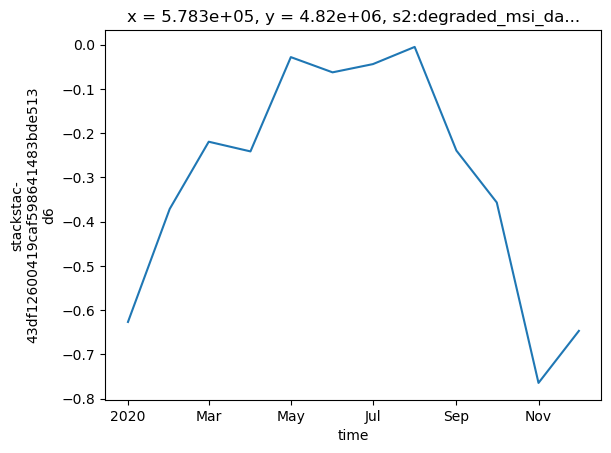

In [ ]:
nir, red = composites.sel(band="B08").astype('float'), composites.sel(band="B04").astype('float')
ndvi_composites = (nir - red) / (nir + red)

ndvi_composites_pixel = ndvi_composites.sel(x=x, y=y, method='nearest')
ndvi_composites_pixel.plot()

## 7. Variations and change in time series

### 7.1. Using the `diff` operator

Sometimes absolute values are not as important as the variation values. In these situations the `dif` operation can be useful. It easily computes the difference between each consecutive value along the specified dimension.

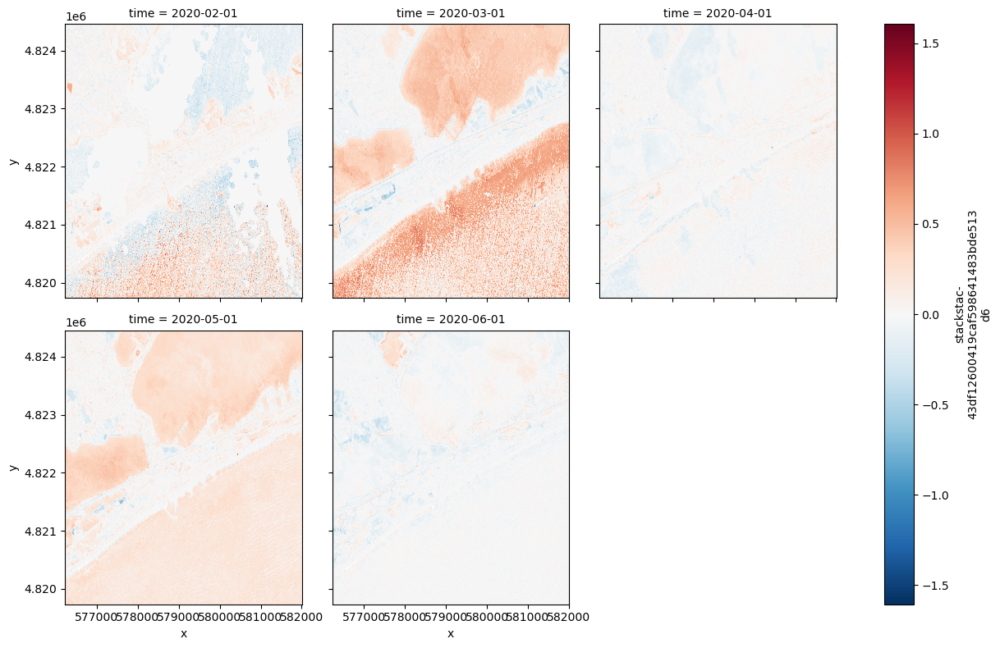

In [ ]:
changes = ndvi_composites.isel(time=range(6)).diff(dim='time')
changes.plot.imshow(col_wrap=3, col="time", size=4)


In this case the variations due to the changes of texture in the water lead to middling results for the interpretability of this operation. This operation can also be performed on single pixels, or even better, averaged over zones similarly to what was covered in the [notebook](04-Zonal-stats-spectral-signatures.ipynb) on zonal stats:

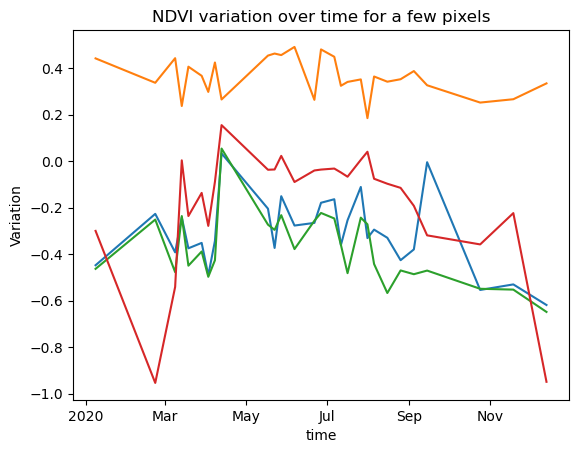

In [ ]:
coordinates = [
    (576135, 4823698),
    (582464, 4823137),
    (576647, 4823717),
    (577426, 4821115)
]
for x,y in coordinates:
    ndvi.sel(x=y, y=y, method='nearest').plot()
plt.title("NDVI variation over time for a few pixels")
plt.ylabel("Variation")
plt.show()

### 7.2. Using sliding windows with `rolling`

The `rolling` operator unlocks the ability to use sliding windows. Sliding windows are mainly used for smoothing irregular data. What follows are a few examples illustrating the use of windowing.

In [ ]:
shuffled_range = np.arange(1,11)
np.random.shuffle(shuffled_range)
easy_array = xr.DataArray(shuffled_range, dims='x')
easy_array

<xarray.DataArray (x: 10)> Size: 80B
array([ 3,  1, 10,  7,  4,  2,  6,  5,  8,  9])
Dimensions without coordinates: x

Note how windowing introduces NaN values at the beginning of the array. This is once again a good reason to take more data than needed as a buffer initially.

In [ ]:
easy_array.rolling(x=3).construct('window')

<xarray.DataArray (x: 10, window: 3)> Size: 240B
array([[nan, nan,  3.],
       [nan,  3.,  1.],
       [ 3.,  1., 10.],
       [ 1., 10.,  7.],
       [10.,  7.,  4.],
       [ 7.,  4.,  2.],
       [ 4.,  2.,  6.],
       [ 2.,  6.,  5.],
       [ 6.,  5.,  8.],
       [ 5.,  8.,  9.]])
Dimensions without coordinates: x, window

In [ ]:
# different window size
easy_array.rolling(x=5).construct('window')

<xarray.DataArray (x: 10, window: 5)> Size: 400B
array([[nan, nan, nan, nan,  3.],
       [nan, nan, nan,  3.,  1.],
       [nan, nan,  3.,  1., 10.],
       [nan,  3.,  1., 10.,  7.],
       [ 3.,  1., 10.,  7.,  4.],
       [ 1., 10.,  7.,  4.,  2.],
       [10.,  7.,  4.,  2.,  6.],
       [ 7.,  4.,  2.,  6.,  5.],
       [ 4.,  2.,  6.,  5.,  8.],
       [ 2.,  6.,  5.,  8.,  9.]])
Dimensions without coordinates: x, window

Using `rolling` with `construct` defines the window as a new dimension, but this is rarely used in practice. Instead, and quite similarly to 'group by' operations, functions are typically used to reduce the number of dimensions back down to the original shape of the array. Let's see a few examples:

In [ ]:
easy_array.rolling(x=3).mean()

<xarray.DataArray (x: 10)> Size: 80B
array([       nan,        nan, 4.66666667, 6.        , 7.        ,
       4.33333333, 4.        , 4.33333333, 6.33333333, 7.33333333])
Dimensions without coordinates: x

In [ ]:
easy_array.rolling(x=3).max()
easy_array.rolling(x=3).min()
easy_array.rolling(x=3).median()


<xarray.DataArray (x: 10)> Size: 80B
array([nan, nan,  3.,  7.,  7.,  4.,  4.,  5.,  6.,  8.])
Dimensions without coordinates: x

Finally it is possible to write our own function and to apply is using `reduce`:

---
As an example we will convolve using the filter `[-0.5, -1, 0, 1, 0.5]` to calculate the variation of ndvi over time. Since we have 5 values, our sliding window has a size of 5. Thus for a value $x_i$, the result of the convolution should be
$$z_t = -0.5*x_{t-2} - x_{t-1} + x_{t+1} + 0.5*x_{t+2} $$


> **Exercice** Write the end of the function `func` which can be used to aplly the filter described above:

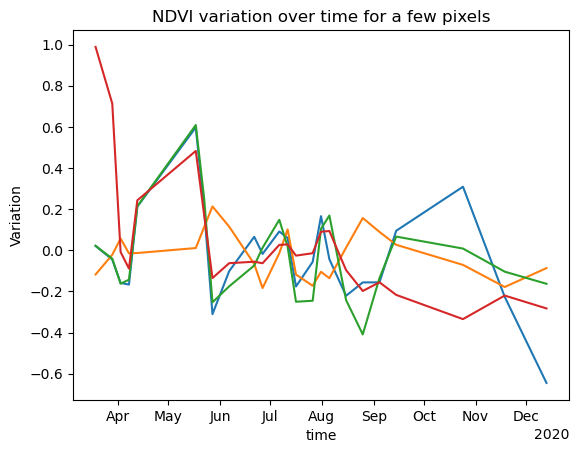

In [ ]:
def func(window, **kwargs):
    coeffs = np.array([-0.5, -1, 0, 1, 0.5])
    # apply the convolution filter just above 
    # to the window argument and return the result
    # fill in here


coordinates = [
    (576135, 4823698),
    (582464, 4823137),
    (576647, 4823717),
    (577426, 4821115)
]

for x,y in coordinates:
    ndvi.sel(x=y, y=y, method='nearest').rolling(time=5).reduce(func).plot()
plt.title("NDVI variation over time for a few pixels")
plt.ylabel("Variation")
plt.show()

---

## 8. Extra: Making a nice-looking animation

### 8.1. Production of animated GIF

We use `GeoGIF` to turn the stack into an animation.

/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/geogif/gif.py:255: RuntimeWarning: invalid value encountered in cast
  u8 = (data * 255).astype("uint8")


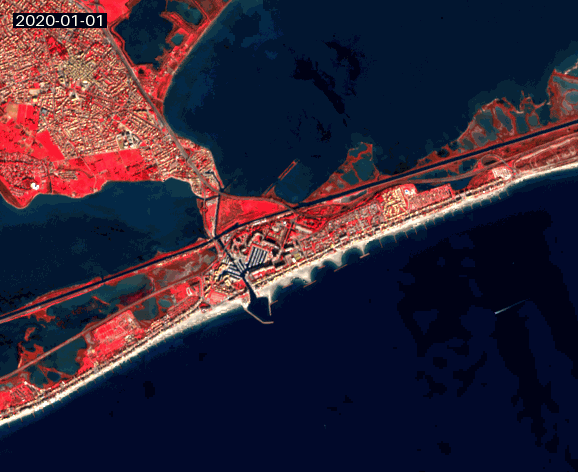

In [ ]:
gif_img = geogif.gif(composites, fps=2)
# use this instead if the array is not yet computed
# gif_img = geogif.dgif(composites, fps=2).compute()
gif_img

If you want to export the animated image as a GIF file, you should use the following instructions. The file will be saved at the same location as the current notebook file. 

In [ ]:
geogif.gif(composites, fps=2, to="example.gif")


# for non-computed (Dask backed) DataArrays
#gif_bytes = geogif.dgif(composites, fps=2, bytes=True, robust=True).compute()

#with open("example.gif", "wb") as f:
#    f.write(gif_bytes)


/home/quentin/miniforge3/envs/rs_notebook/lib/python3.11/site-packages/geogif/gif.py:255: RuntimeWarning: invalid value encountered in cast
  u8 = (data * 255).astype("uint8")
